In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
cd/content/drive/Shareddrives/MobileNetV2

/content/drive/Shareddrives/MobileNetV2


In [ ]:
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [ ]:
!pip install visualkeras

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.0/993.0 kB 35.6 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model

In [ ]:
# Define parameters
#IMG_SIZE = 224
num_classes = 2
batch_size = 32

In [ ]:
# Define the paths to the training, testing, and validation data
train_dir = '/content/drive/Shareddrives/MobileNetV2/Dataset_withval/train'
test_dir = '/content/drive/Shareddrives/MobileNetV2/Dataset_withval/test'
val_dir = '/content/drive/Shareddrives/MobileNetV2/Dataset_withval/validation'

In [ ]:
# Define the data generators for training, testing, and validation
train_datagen = ImageDataGenerator(rescale=1./255,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True)
test_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(224, 224),
                                                    batch_size=batch_size,
                                                    class_mode='categorical')
test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=(224, 224),
                                                  batch_size=batch_size,
                                                  class_mode='categorical')
val_generator = val_datagen.flow_from_directory(val_dir,
                                                target_size=(224, 224),
                                                batch_size=batch_size,
                                                class_mode='categorical')


Found 840 images belonging to 2 classes.
Found 180 images belonging to 2 classes.
Found 180 images belonging to 2 classes.


In [ ]:
# Define the Inceptionv3 model
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

87910968/87910968 [==============================] - 3s 0us/step


In [ ]:
# Add a global average pooling layer and a fully connected layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

In [ ]:
# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

In [ ]:
# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
import os

current_dir = os.getcwd()
print("Current working directory:", current_dir)

Current working directory: /content


In [ ]:
layer_names=[layer.name for layer in base_model.layers]
print(layer_names)

['input_1', 'conv2d', 'batch_normalization', 'activation', 'conv2d_1', 'batch_normalization_1', 'activation_1', 'conv2d_2', 'batch_normalization_2', 'activation_2', 'max_pooling2d', 'conv2d_3', 'batch_normalization_3', 'activation_3', 'conv2d_4', 'batch_normalization_4', 'activation_4', 'max_pooling2d_1', 'conv2d_8', 'batch_normalization_8', 'activation_8', 'conv2d_6', 'conv2d_9', 'batch_normalization_6', 'batch_normalization_9', 'activation_6', 'activation_9', 'average_pooling2d', 'conv2d_5', 'conv2d_7', 'conv2d_10', 'conv2d_11', 'batch_normalization_5', 'batch_normalization_7', 'batch_normalization_10', 'batch_normalization_11', 'activation_5', 'activation_7', 'activation_10', 'activation_11', 'mixed0', 'conv2d_15', 'batch_normalization_15', 'activation_15', 'conv2d_13', 'conv2d_16', 'batch_normalization_13', 'batch_normalization_16', 'activation_13', 'activation_16', 'average_pooling2d_1', 'conv2d_12', 'conv2d_14', 'conv2d_17', 'conv2d_18', 'batch_normalization_12', 'batch_normaliza

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

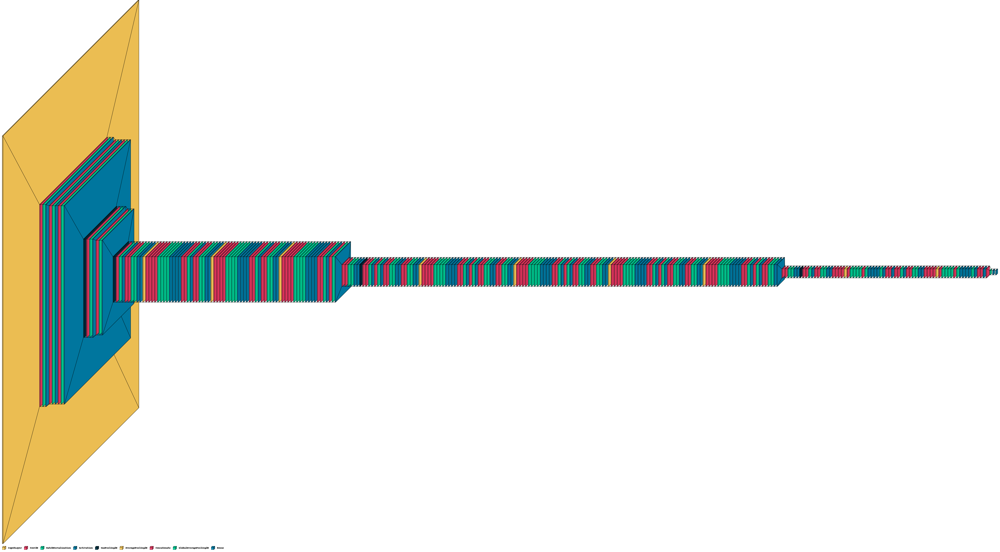

In [ ]:
model1=model
import visualkeras
from PIL import ImageFont
visualkeras.layered_view(model1, scale_xy=8, scale_z=3, max_z=3, legend=True)

In [ ]:
#load tensorboard

%reload_ext tensorboard
%tensorboard --logdir '/content/sample_data'

Reusing TensorBoard on port 6006 (pid 3800), started 0:00:08 ago. (Use '!kill 3800' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# Set the checkpoint file path
checkpoint_filepath = '/content/drive/Shareddrives/MobileNetV2/InceptionV3/best_Inception_model.h5'

In [ ]:
# Train the model
history = model.fit(train_generator,
                    steps_per_epoch=len(train_generator),
                    epochs=10,
                    validation_data=val_generator,
                    validation_steps=len(val_generator))

Epoch 1/10
27/27 [==============================] - 310s 9s/step - loss: 0.9455 - accuracy: 0.6893 - val_loss: 31.5015 - val_accuracy: 0.5000
Epoch 2/10
27/27 [==============================] - 75s 3s/step - loss: 0.3169 - accuracy: 0.8738 - val_loss: 1.3588 - val_accuracy: 0.5500
Epoch 3/10
27/27 [==============================] - 74s 3s/step - loss: 0.2425 - accuracy: 0.9107 - val_loss: 1.7381 - val_accuracy: 0.8278
Epoch 4/10
27/27 [==============================] - 73s 3s/step - loss: 0.2151 - accuracy: 0.9214 - val_loss: 1.0246 - val_accuracy: 0.8778
Epoch 5/10
27/27 [==============================] - 75s 3s/step - loss: 0.1281 - accuracy: 0.9583 - val_loss: 0.7894 - val_accuracy: 0.9278
Epoch 6/10
27/27 [==============================] - 74s 3s/step - loss: 0.1248 - accuracy: 0.9619 - val_loss: 3.7149 - val_accuracy: 0.8667
Epoch 7/10
27/27 [==============================] - 75s 3s/step - loss: 0.1666 - accuracy: 0.9381 - val_loss: 1.0810 - val_accuracy: 0.6833
Epoch 8/10
27/27 [

In [ ]:
# Train the model
history = model.fit(train_generator,
                    steps_per_epoch=len(train_generator),
                    epochs=10,
                    validation_data=val_generator,
                    validation_steps=len(val_generator))

Epoch 1/10
27/27 [==============================] - 76s 3s/step - loss: 0.1247 - accuracy: 0.9619 - val_loss: 2.0184 - val_accuracy: 0.5778
Epoch 2/10
27/27 [==============================] - 73s 3s/step - loss: 0.1294 - accuracy: 0.9631 - val_loss: 8.0697 - val_accuracy: 0.5056
Epoch 3/10
27/27 [==============================] - 76s 3s/step - loss: 0.1057 - accuracy: 0.9643 - val_loss: 7.8553 - val_accuracy: 0.5722
Epoch 4/10
27/27 [==============================] - 71s 3s/step - loss: 0.1274 - accuracy: 0.9571 - val_loss: 0.6786 - val_accuracy: 0.7222
Epoch 5/10
27/27 [==============================] - 77s 3s/step - loss: 0.0760 - accuracy: 0.9798 - val_loss: 0.3780 - val_accuracy: 0.9167
Epoch 6/10
27/27 [==============================] - 70s 3s/step - loss: 0.0844 - accuracy: 0.9774 - val_loss: 0.3339 - val_accuracy: 0.9389
Epoch 7/10
27/27 [==============================] - 77s 3s/step - loss: 0.0724 - accuracy: 0.9726 - val_loss: 0.2735 - val_accuracy: 0.9500
Epoch 8/10
27/27 [==

In [ ]:
# Train the model
history = model.fit(train_generator,
                    steps_per_epoch=len(train_generator),
                    epochs=10,
                    validation_data=val_generator,
                    validation_steps=len(val_generator))

Epoch 1/10
27/27 [==============================] - 510s 17s/step - loss: 0.9595 - accuracy: 0.5929 - val_loss: 41.7369 - val_accuracy: 0.5000
Epoch 2/10
27/27 [==============================] - 83s 3s/step - loss: 0.6457 - accuracy: 0.6369 - val_loss: 15.1129 - val_accuracy: 0.5000
Epoch 3/10
27/27 [==============================] - 82s 3s/step - loss: 0.5808 - accuracy: 0.7060 - val_loss: 11.5576 - val_accuracy: 0.5000
Epoch 4/10
27/27 [==============================] - 82s 3s/step - loss: 0.2999 - accuracy: 0.8726 - val_loss: 0.6627 - val_accuracy: 0.8444
Epoch 5/10
27/27 [==============================] - 82s 3s/step - loss: 0.1978 - accuracy: 0.9238 - val_loss: 2.6006 - val_accuracy: 0.7778
Epoch 6/10
27/27 [==============================] - 82s 3s/step - loss: 0.2022 - accuracy: 0.9286 - val_loss: 1.1546 - val_accuracy: 0.8889
Epoch 7/10
27/27 [==============================] - 82s 3s/step - loss: 0.1975 - accuracy: 0.9321 - val_loss: 3.1634 - val_accuracy: 0.6444
Epoch 8/10
27/2

In [ ]:
# Evaluate the model on the test data
test_loss, test_acc = model.evaluate(test_generator)
print(f'Test Acc: {test_acc}')

In [ ]:
# Evaluate the best model on the test set
best_model = tf.keras.models.load_model(checkpoint_filepath)
test_loss, test_acc = best_model.evaluate(test_generator)
print(f'Test accuracy: {test_acc}')

6/6 [==============================] - 83s 16s/step - loss: 1.7508 - accuracy: 0.8167
Test accuracy: 0.8166666626930237


In [ ]:
# Save the model
model.save(checkpoint_filepath)